In [1]:
# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Import required libraries & modules

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
from datetime import datetime
import plotly.express as px
import plotly.graph_objs as go

# Import data

In [3]:
df=pd.read_excel('Booking_Data.xlsx')
df.head()

,Booking ID,Hotel,Booking Date,Arrival Date,Lead Time,Nights,Guests,Distribution Channel,Customer Type,Country,Deposit Type,Avg Daily Rate,Status,Status Update,Cancelled (0/1),Revenue,Revenue Loss
0,1,Resort,2014-07-24,2015-07-01,342,0,2,Direct,Transient,Portugal,No Deposit,0.0,Check-Out,2015-07-01,0,0.0,0.0
1,2,Resort,2013-06-24,2015-07-01,737,0,2,Direct,Transient,Portugal,No Deposit,0.0,Check-Out,2015-07-01,0,0.0,0.0
2,3,Resort,2015-06-24,2015-07-01,7,1,1,Direct,Transient,United Kingdom,No Deposit,75.0,Check-Out,2015-07-02,0,75.0,0.0
3,4,Resort,2015-06-18,2015-07-01,13,1,1,Corporate,Transient,United Kingdom,No Deposit,75.0,Check-Out,2015-07-02,0,75.0,0.0
4,5,Resort,2015-06-17,2015-07-01,14,2,2,Online Travel Agent,Transient,United Kingdom,No Deposit,98.0,Check-Out,2015-07-03,0,196.0,0.0


# Exploratory Data Analysis

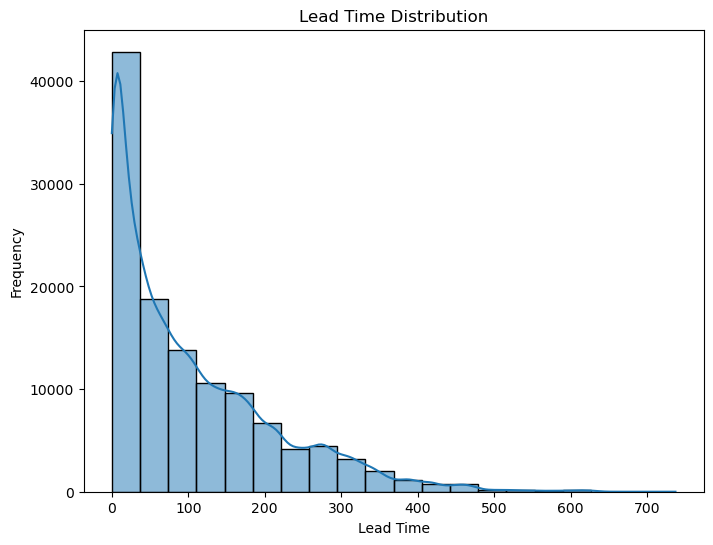

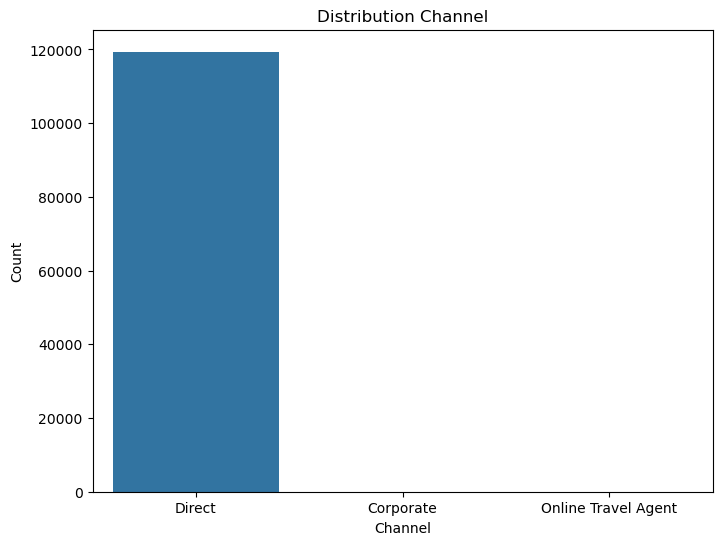

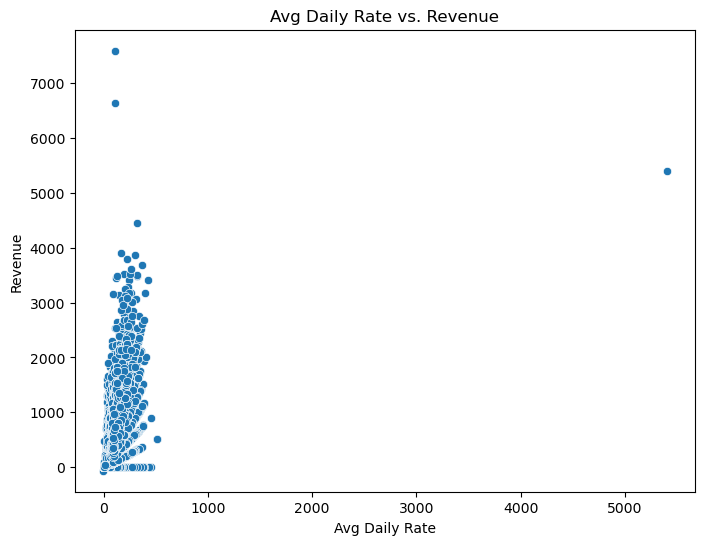

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.histplot(df['Lead Time'], bins=20, kde=True)
plt.title('Lead Time Distribution')
plt.xlabel('Lead Time')
plt.ylabel('Frequency')
plt.show()
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Distribution Channel')
plt.title('Distribution Channel')
plt.xlabel('Channel')
plt.ylabel('Count')
plt.show()
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='Avg Daily Rate', y='Revenue')
plt.title('Avg Daily Rate vs. Revenue')
plt.xlabel('Avg Daily Rate')
plt.ylabel('Revenue')
plt.show()


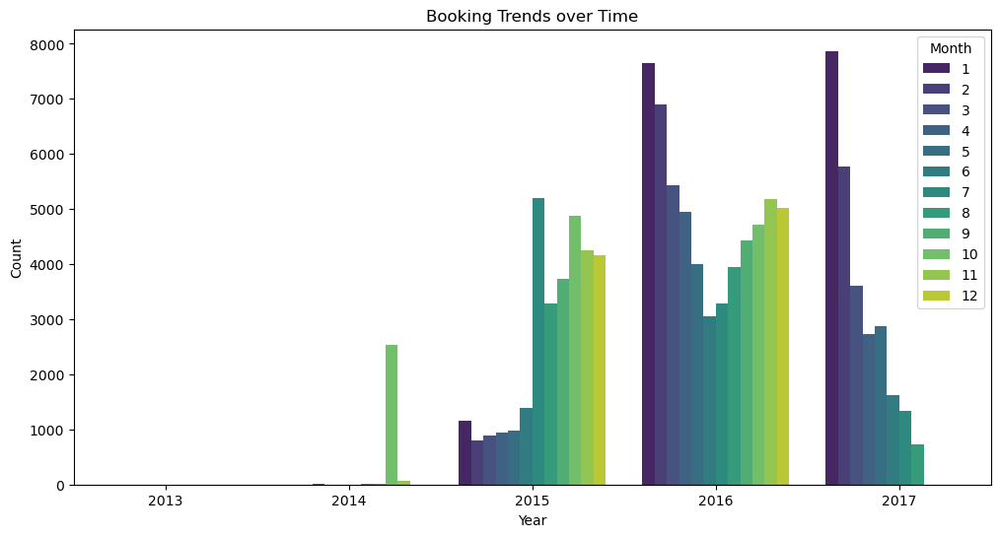

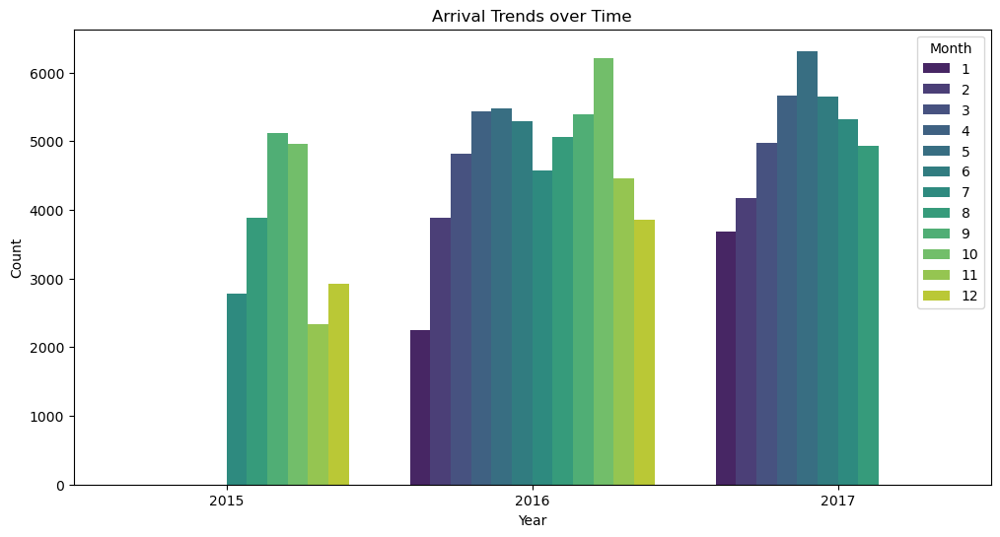

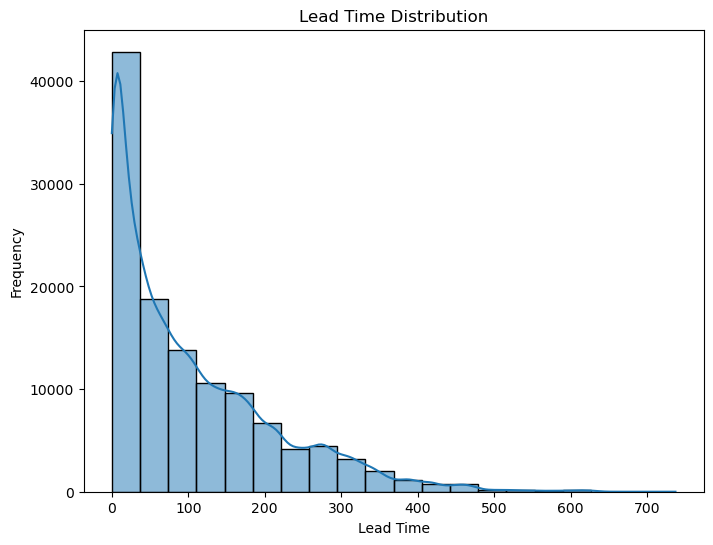

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns


df['Booking Date'] = pd.to_datetime(df['Booking Date'])
df['Arrival Date'] = pd.to_datetime(df['Arrival Date'])
df['Booking Year'] = df['Booking Date'].dt.year
df['Booking Month'] = df['Booking Date'].dt.month
df['Arrival Year'] = df['Arrival Date'].dt.year
df['Arrival Month'] = df['Arrival Date'].dt.month
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Booking Year', hue='Booking Month', palette='viridis')
plt.title('Booking Trends over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Month')
plt.show()
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Arrival Year', hue='Arrival Month', palette='viridis')
plt.title('Arrival Trends over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Month')
plt.show()
plt.figure(figsize=(8, 6))
sns.histplot(df['Lead Time'], bins=20, kde=True)
plt.title('Lead Time Distribution')
plt.xlabel('Lead Time')
plt.ylabel('Frequency')
plt.show()


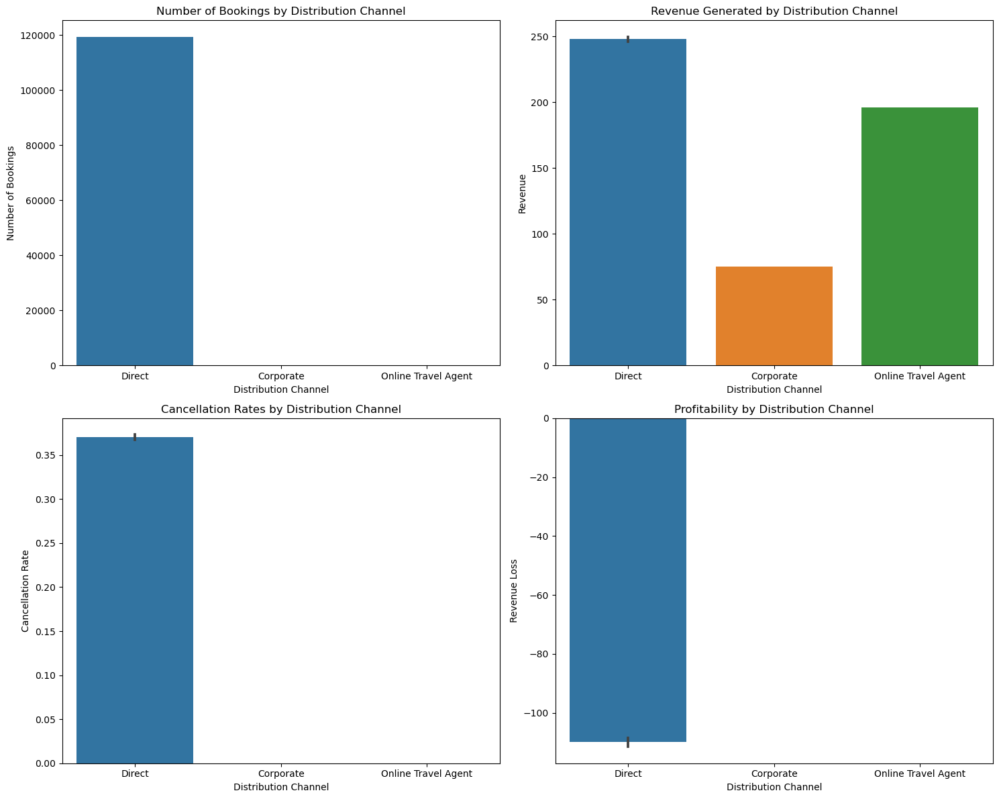

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(15, 12))
sns.countplot(data=df, x='Distribution Channel', ax=axs[0, 0])
axs[0, 0].set_title('Number of Bookings by Distribution Channel')
axs[0, 0].set_xlabel('Distribution Channel')
axs[0, 0].set_ylabel('Number of Bookings')
sns.barplot(data=df, x='Distribution Channel', y='Revenue', ax=axs[0, 1])
axs[0, 1].set_title('Revenue Generated by Distribution Channel')
axs[0, 1].set_xlabel('Distribution Channel')
axs[0, 1].set_ylabel('Revenue')
sns.barplot(data=df, x='Distribution Channel', y='Cancelled (0/1)', ax=axs[1, 0])
axs[1, 0].set_title('Cancellation Rates by Distribution Channel')
axs[1, 0].set_xlabel('Distribution Channel')
axs[1, 0].set_ylabel('Cancellation Rate')
sns.barplot(data=df, x='Distribution Channel', y='Revenue Loss', ax=axs[1, 1])
axs[1, 1].set_title('Profitability by Distribution Channel')
axs[1, 1].set_xlabel('Distribution Channel')
axs[1, 1].set_ylabel('Revenue Loss')
plt.tight_layout()
plt.show()

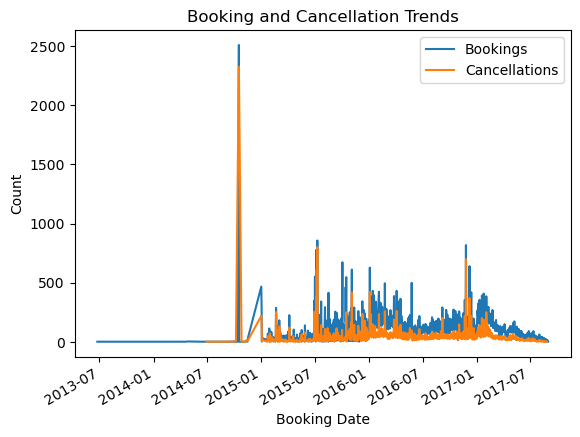

In [7]:
df['Booking Date'] = pd.to_datetime(df['Booking Date'])
booking_counts = df['Booking Date'].value_counts().sort_index()
booking_counts.plot(x='Booking Date', y='Booking Count', label='Bookings')
cancelled_counts = df[df['Cancelled (0/1)'] == 1]['Booking Date'].value_counts().sort_index()
cancelled_counts.plot(x='Booking Date', y='Cancellation Count', label='Cancellations')
plt.xlabel('Booking Date')
plt.ylabel('Count')
plt.title('Booking and Cancellation Trends')
plt.legend()
plt.show()

In [8]:
df['Year-Month'] = df['Booking Date'].dt.to_period('M')
df["Booking Date"] = pd.to_datetime(df["Booking Date"])
df["Year-Month"] = df["Year-Month"].astype(str)
booking_trends = df.groupby("Year-Month").size().reset_index(name='Bookings')
fig = px.line(booking_trends, x="Year-Month", y="Bookings", title="Booking Trends Over Time",
              labels={"Year-Month": "Month", "Bookings": "Number of Bookings"},
              markers=True)
fig.update_xaxes(dtick="M1", tickformat="%b\n%Y", title="Month")
fig.update_layout(xaxis_title="Month", yaxis_title="Number of Bookings")

fig.show()

In [9]:
bookings_by_country=df['Country'].value_counts().reset_index()
bookings_by_country.rename(columns={'count': 'Bookings'}, inplace=True)
bookings_by_country

,Country,Bookings
0,Portugal,48590
1,United Kingdom,12129
2,France,10415
3,Spain,8568
4,Germany,7287
...,...,...
169,Djibouti,1
170,Botswana,1
171,Honduras,1
172,Virgin Islands,1


In [10]:
custom_color_scale = [
    [0.0, "rgba(255,224,189,1)"], 
    [0.5, "rgba(244,164,96,1)"],  
    [1.0, "rgba(139,69,19,1)"]  
]
fig = px.choropleth(bookings_by_country,
                    locations='Country',  
                    locationmode='country names',  
                    color=np.log10(bookings_by_country['Bookings']), 
                    color_continuous_scale=custom_color_scale,  
                    title='Global Booking Distribution',  
                    hover_name='Country',
                    hover_data='Bookings', 
                    labels={'color': 'Log10(Bookings)'})  
fig.show()


In [11]:
import plotly.express as px
fig = px.histogram(df, x='Lead Time',
                   title='Distribution of Lead Times for Bookings',
                   labels={'Lead Time': 'Lead Time (days)'},
                   opacity=0.8,  
                   color_discrete_sequence=['indianred'])  

fig.update_layout(xaxis_title="Lead Time (days)",
                  yaxis_title="Number of Bookings",
                  bargap=0.2)

fig.show()

In [12]:
import plotly.express as px
fig = px.box(df, x='Distribution Channel', y='Avg Daily Rate',
             title='Average Daily Rate (ADR) by Distribution Channel',
             labels={'Avg Daily Rate': 'ADR ($)', 'Distribution Channel': 'Distribution Channel'},
             color='Distribution Channel') 
fig.update_layout(xaxis_title="Distribution Channel",
                  yaxis_title="Average Daily Rate (ADR) $",
                  boxmode='group',
                  yaxis=dict(range=[0, 500]))  

fig.show()


In [13]:
df['Arrival Date'] = pd.to_datetime(df['Arrival Date'])
revenue_loss_over_time = df.groupby(df['Arrival Date'].dt.to_period('M'))['Revenue Loss'].sum().reset_index()
revenue_loss_over_time['Arrival Date'] = revenue_loss_over_time['Arrival Date'].dt.to_timestamp()
fig = px.line(revenue_loss_over_time, x='Arrival Date', y='Revenue Loss',
              title='Revenue Loss Over Time',
              labels={'Revenue Loss': 'Revenue Loss ($)', 'Arrival Date': 'Date'},
              markers=True)
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Revenue Loss ($)',
                  xaxis=dict(tickformat='%b\n%Y')) 

fig.show()

# "This graph shows us how much money our hotel has not been able to earn from expected bookings. This might include situations like guests cancelling their rooms, or rooms that remained unbooked. The vertical axis shows the amount of revenue lost in dollars, and the horizontal axis represents the time from July 2015 to July 2017.

# At the start of the graph in July 2015, we were losing about $200,000 per month. As time went on, the amount of revenue we were losing started to increase, reaching up to $600,000 by early 2016. This was a challenging period for us.

# However, after that peak, we see some ups and downs, but the overall trend is that the amount of revenue we're losing has been going down. By July 2017, our monthly revenue loss decreased significantly to the lowest point in the graph at around $1.4 million.

# This is a good sign! It means that by the middle of 2017, we were doing much better at keeping our rooms booked and reducing cancellations. This improvement could be due to many factors, like better marketing, more competitive pricing, improved customer service, or a stronger economy.

# In summary, while it's not great to see that we've lost revenue, the important thing is that we're on the right track and have been improving over the last two years. Our strategies to reduce these losses are showing positive results, and we should continue in this direction."

# Remember to provide context for any strategies or actions that have been implemented during this time frame to help the audience understand what led to the improvements seen in the graph.

In [14]:
df['Arrival Date'] = pd.to_datetime(df['Arrival Date'])
revenue_over_time = df.groupby(df['Arrival Date'].dt.to_period('M'))['Revenue'].sum().reset_index()
revenue_over_time['Arrival Date'] = revenue_over_time['Arrival Date'].dt.to_timestamp()
fig = px.line(revenue_over_time, x='Arrival Date', y='Revenue',
              title='Revenue Over Time',
              labels={'Revenue': 'Revenue ($)', 'Arrival Date': 'Date'},
              markers=True)
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Revenue ($)',
                  xaxis=dict(tickformat='%b\n%Y'))
fig.show()


In [15]:

df['Arrival Date'] = pd.to_datetime(df['Arrival Date'])
summary_over_time = df.groupby(df['Arrival Date'].dt.to_period('M')).agg({'Revenue': 'sum', 'Revenue Loss': 'sum'}).reset_index()
summary_over_time['Arrival Date'] = summary_over_time['Arrival Date'].dt.to_timestamp()
fig = go.Figure()
fig.add_trace(go.Line(x=summary_over_time['Arrival Date'], y=summary_over_time['Revenue'],
                      name='Revenue', marker=dict(color='green')))
fig.add_trace(go.Line(x=summary_over_time['Arrival Date'], y=summary_over_time['Revenue Loss'],
                      name='Revenue Loss', marker=dict(color='red')))
fig.update_layout(title='Revenue and Revenue Loss Over Time',
                  xaxis_title='Date',
                  yaxis_title='Amount ($)',
                  xaxis=dict(tickformat='%b\n%Y'))

fig.show()


/Users/domala81/opt/anaconda3/envs/Lungsegment/lib/python3.9/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.


/Users/domala81/opt/anaconda3/envs/Lungsegment/lib/python3.9/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [16]:
df['Arrival Date'] = pd.to_datetime(df['Arrival Date'])
df['Net Revenue'] = df['Revenue'] + df['Revenue Loss']
summary_over_time = df.groupby(df['Arrival Date'].dt.to_period('M')).agg({
    'Revenue': 'sum',
    'Revenue Loss': 'sum',
    'Net Revenue': 'sum'
}).reset_index()
summary_over_time['Arrival Date'] = summary_over_time['Arrival Date'].dt.to_timestamp()
fig = px.line(summary_over_time, x='Arrival Date',
              y=['Revenue', 'Revenue Loss', 'Net Revenue'],
              title='Revenue and Net Revenue Over Time',
              labels={'value': 'Dollars ($)', 'variable': 'Type', 'Arrival Date': 'Date'},
              markers=True)
fig.update_layout(xaxis_title='Date',
                  yaxis_title='Dollars ($)',
                  xaxis=dict(tickformat='%b\n%Y'))
fig.show()


In [17]:
import plotly.graph_objects as go

# Count the number of cancellations and no cancellations
cancel_counts = df['Cancelled (0/1)'].value_counts()

# Create a pie chart
fig = go.Figure(data=go.Pie(labels=['No Cancellation', 'Cancellation'], values=cancel_counts, hole=0.1))

# Set the title
fig.update_layout(title='Cancellation vs No Cancellation')

# Show the chart
fig.show()

In [18]:
# Check for missing values in the dataset
missing_values = df.isnull().sum()

# Check the data types, especially for columns with currency values to see how they're being interpreted
data_types = df.dtypes

missing_values, data_types

(Booking ID                0
 Hotel                     0
 Booking Date              0
 Arrival Date              0
 Lead Time                 0
 Nights                    0
 Guests                    0
 Distribution Channel      0
 Customer Type             0
 Country                 488
 Deposit Type              0
 Avg Daily Rate            0
 Status                    0
 Status Update             0
 Cancelled (0/1)           0
 Revenue                   0
 Revenue Loss              0
 Booking Year              0
 Booking Month             0
 Arrival Year              0
 Arrival Month             0
 Year-Month                0
 Net Revenue               0
 dtype: int64,
 Booking ID                       int64
 Hotel                           object
 Booking Date            datetime64[ns]
 Arrival Date            datetime64[ns]
 Lead Time                        int64
 Nights                           int64
 Guests                           int64
 Distribution Channel            objec

In [19]:
# Convert currency columns to numeric
currency_columns = ['Avg Daily Rate', 'Revenue', 'Revenue Loss']
for col in currency_columns:
    df[col] = df[col].replace('[\$,]', '', regex=True).astype(float)

# Handle missing values in 'Country' column by imputing with 'Unknown'
df['Country'].fillna('Unknown', inplace=True)

# Convert date columns to datetime format
date_columns = ['Booking Date', 'Arrival Date', 'Status Update']
for col in date_columns:
    df[col] = pd.to_datetime(df[col])

# Check the changes
df.info(), df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Booking ID            119390 non-null  int64         
 1   Hotel                 119390 non-null  object        
 2   Booking Date          119390 non-null  datetime64[ns]
 3   Arrival Date          119390 non-null  datetime64[ns]
 4   Lead Time             119390 non-null  int64         
 5   Nights                119390 non-null  int64         
 6   Guests                119390 non-null  int64         
 7   Distribution Channel  119390 non-null  object        
 8   Customer Type         119390 non-null  object        
 9   Country               119390 non-null  object        
 10  Deposit Type          119390 non-null  object        
 11  Avg Daily Rate        119390 non-null  float64       
 12  Status                119390 non-null  object        
 13 

(None,
    Booking ID   Hotel Booking Date Arrival Date  Lead Time  Nights  Guests  \
 0           1  Resort   2014-07-24   2015-07-01        342       0       2   
 1           2  Resort   2013-06-24   2015-07-01        737       0       2   
 2           3  Resort   2015-06-24   2015-07-01          7       1       1   
 3           4  Resort   2015-06-18   2015-07-01         13       1       1   
 4           5  Resort   2015-06-17   2015-07-01         14       2       2   
 
   Distribution Channel Customer Type         Country  ... Status Update  \
 0               Direct     Transient        Portugal  ...    2015-07-01   
 1               Direct     Transient        Portugal  ...    2015-07-01   
 2               Direct     Transient  United Kingdom  ...    2015-07-02   
 3            Corporate     Transient  United Kingdom  ...    2015-07-02   
 4  Online Travel Agent     Transient  United Kingdom  ...    2015-07-03   
 
    Cancelled (0/1) Revenue Revenue Loss  Booking Year  Boo

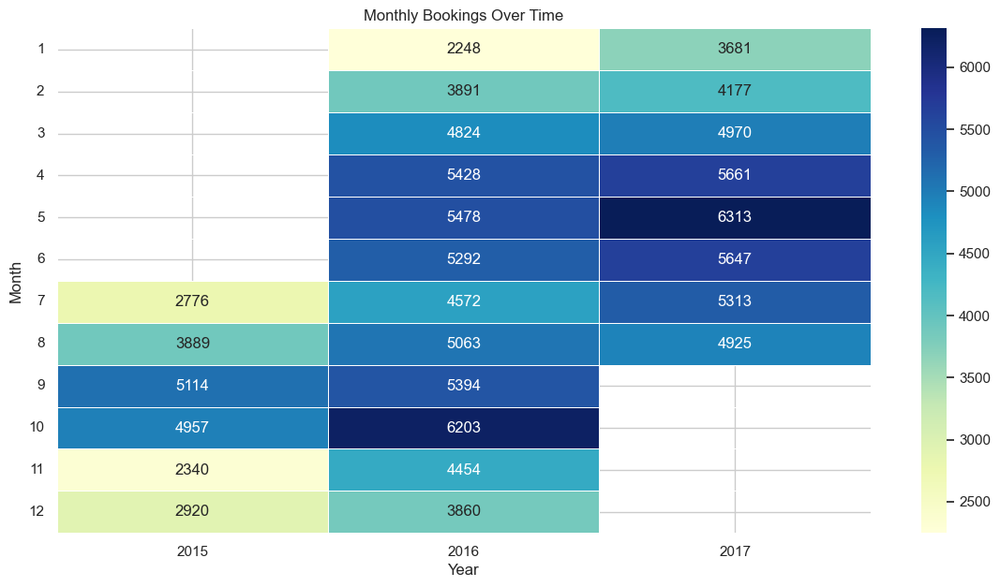

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the visual style for plots
sns.set(style="whitegrid")

# Analyzing booking patterns over time - We'll start by looking at the number of bookings per month
df['Year'] = df['Arrival Date'].dt.year
df['Month'] = df['Arrival Date'].dt.month

# Aggregate data to count bookings by month and year
monthly_bookings = df.groupby(['Year', 'Month']).size().reset_index(name='Bookings')

# Pivot data for easier plotting
monthly_bookings_pivot = monthly_bookings.pivot(index="Month", columns="Year", values="Bookings")

# Plotting
plt.figure(figsize=(14, 7))
sns.heatmap(monthly_bookings_pivot, annot=True, fmt=".0f", linewidths=.5, cmap="YlGnBu")
plt.title('Monthly Bookings Over Time')
plt.xlabel('Year')
plt.ylabel('Month')
plt.yticks(rotation=0)
plt.grid(True)
plt.show()

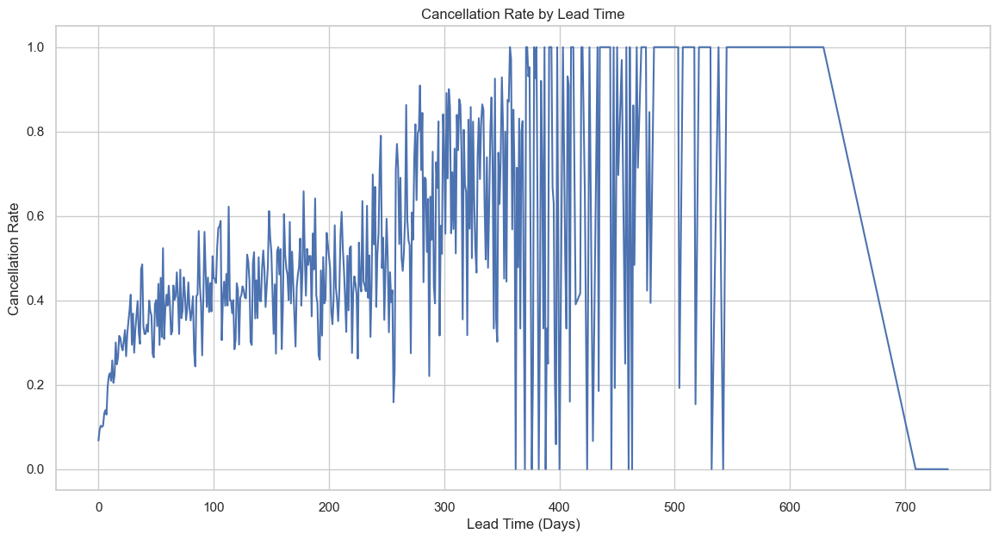

In [21]:
# Group data by lead time, calculating the cancellation rate for each lead time
lead_time_cancellation_rate = df.groupby('Lead Time')['Cancelled (0/1)'].mean().reset_index(name='Cancellation Rate')

# Plotting
plt.figure(figsize=(14, 7))
sns.lineplot(x='Lead Time', y='Cancellation Rate', data=lead_time_cancellation_rate)
plt.title('Cancellation Rate by Lead Time')
plt.xlabel('Lead Time (Days)')
plt.ylabel('Cancellation Rate')
plt.show()

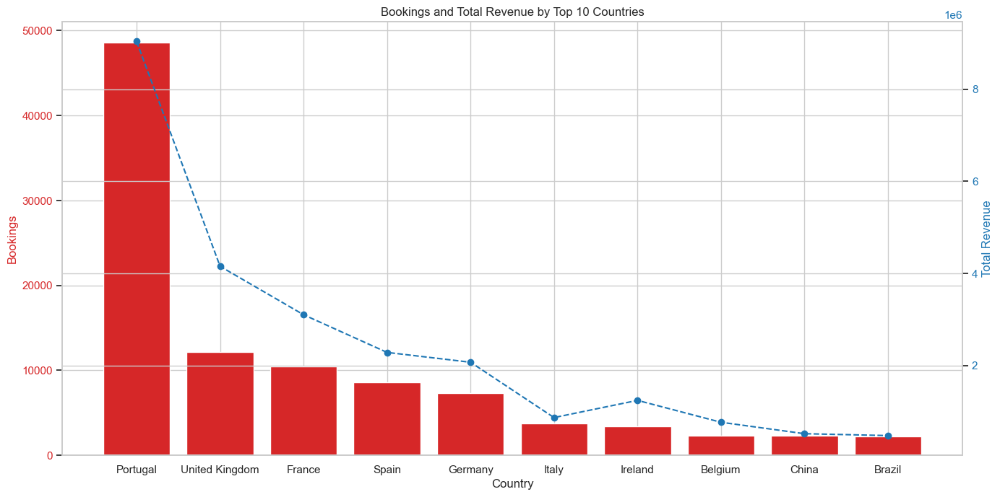

In [22]:
# Exploring distribution of guests by country and its impact on revenue
# We'll focus on the top 10 countries by the number of guests to see how these markets contribute to overall revenue.

# Group data by country, counting bookings and summing revenue
country_analysis = df.groupby('Country').agg(Bookings=('Booking ID', 'count'), TotalRevenue=('Revenue', 'sum')).reset_index()

# Sort by the number of bookings to get top 10 countries
top_countries = country_analysis.sort_values(by='Bookings', ascending=False).head(10)

# Plotting the number of bookings and total revenue contributed by the top 10 countries
fig, ax1 = plt.subplots(figsize=(14, 7))

color = 'tab:red'
ax1.set_xlabel('Country')
ax1.set_ylabel('Bookings', color=color)
ax1.bar(top_countries['Country'], top_countries['Bookings'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # Instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('Total Revenue', color=color)  # We already handled the x-label with ax1
ax2.plot(top_countries['Country'], top_countries['TotalRevenue'], color=color, marker='o', linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # To ensure the right y-label is not slightly clipped
plt.title('Bookings and Total Revenue by Top 10 Countries')
plt.show()


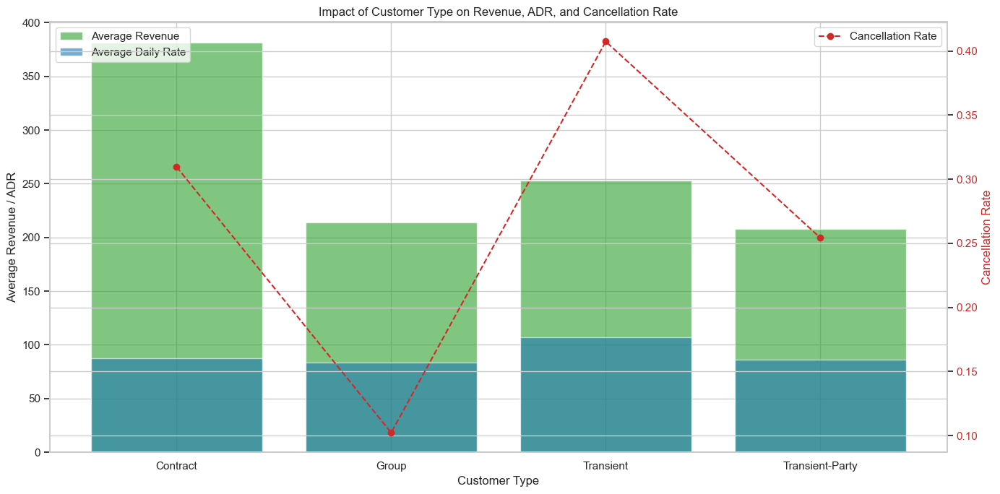

In [23]:
# Analyzing the impact of different customer types on revenue and cancellation rates

# Group data by customer type, aggregating average revenue, average daily rate (ADR), and cancellation rate
customer_type_analysis = df.groupby('Customer Type').agg(
    AverageRevenue=('Revenue', 'mean'),
    AverageDailyRate=('Avg Daily Rate', 'mean'),
    CancellationRate=('Cancelled (0/1)', 'mean')
).reset_index()

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7))

# Bar plot for average revenue and ADR
customer_types = customer_type_analysis['Customer Type']
average_revenue = customer_type_analysis['AverageRevenue']
average_daily_rate = customer_type_analysis['AverageDailyRate']

ax1.bar(customer_types, average_revenue, color='tab:green', alpha=0.6, label='Average Revenue')
ax1.bar(customer_types, average_daily_rate, color='tab:blue', alpha=0.6, label='Average Daily Rate')
ax1.set_xlabel('Customer Type')
ax1.set_ylabel('Average Revenue / ADR')
ax1.tick_params(axis='y')
ax1.legend(loc='upper left')

# Line plot for cancellation rate on secondary axis
ax2 = ax1.twinx()
cancellation_rate = customer_type_analysis['CancellationRate']
ax2.plot(customer_types, cancellation_rate, color='tab:red', marker='o', linestyle='--', label='Cancellation Rate')
ax2.set_ylabel('Cancellation Rate', color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')
ax2.legend(loc='upper right')

plt.title('Impact of Customer Type on Revenue, ADR, and Cancellation Rate')
fig.tight_layout()
plt.show()

# This analysis provides insights into how different customer types contribute to revenue and their cancellation behaviors.

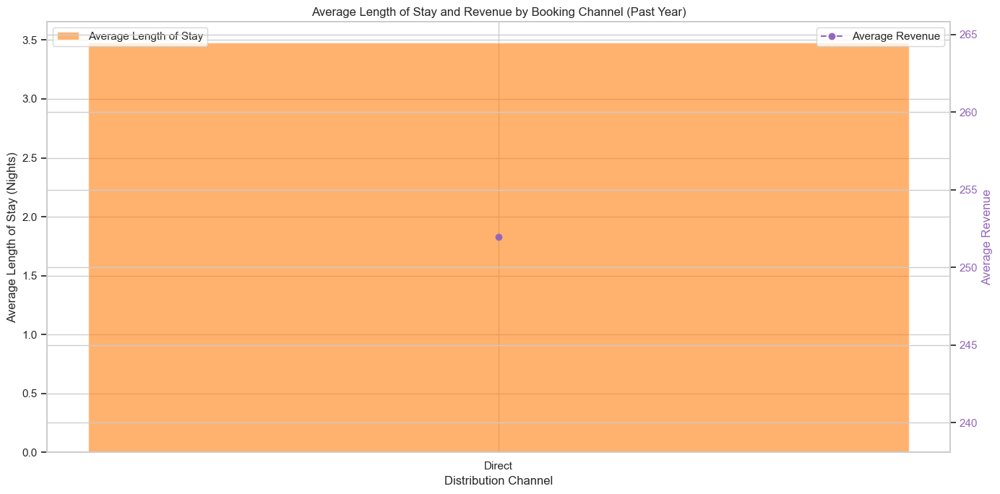

In [24]:
#How does the average length of stay vary by booking channel over the past year, and what is its impact on revenue?

from datetime import datetime

# Filter the dataset for bookings in the past year
# Determine the most recent booking date in the dataset to define "the past year" from that point
most_recent_booking_date = df['Arrival Date'].max()
one_year_ago = most_recent_booking_date - pd.DateOffset(years=1)

# Filter for bookings within the last year
data_last_year = df[df['Arrival Date'] >= one_year_ago]

# Analyze average length of stay and revenue by booking channel for the past year
analysis_past_year = data_last_year.groupby('Distribution Channel').agg(
    AverageLengthOfStay=('Nights', 'mean'),
    AverageRevenue=('Revenue', 'mean')
).reset_index()

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 7))

# Bar plot for average length of stay
channels = analysis_past_year['Distribution Channel']
length_of_stay = analysis_past_year['AverageLengthOfStay']

ax1.bar(channels, length_of_stay, color='tab:orange', alpha=0.6, label='Average Length of Stay')
ax1.set_xlabel('Distribution Channel')
ax1.set_ylabel('Average Length of Stay (Nights)')
ax1.tick_params(axis='y')
ax1.legend(loc='upper left')

# Line plot for average revenue on secondary axis
ax2 = ax1.twinx()
average_revenue = analysis_past_year['AverageRevenue']
ax2.plot(channels, average_revenue, color='tab:purple', marker='o', linestyle='--', label='Average Revenue')
ax2.set_ylabel('Average Revenue', color='tab:purple')
ax2.tick_params(axis='y', labelcolor='tab:purple')
ax2.legend(loc='upper right')

plt.title('Average Length of Stay and Revenue by Booking Channel (Past Year)')
fig.tight_layout()
plt.show()

# This analysis could reveal how different booking channels impact guest behavior and revenue, providing insights for targeted strategies.


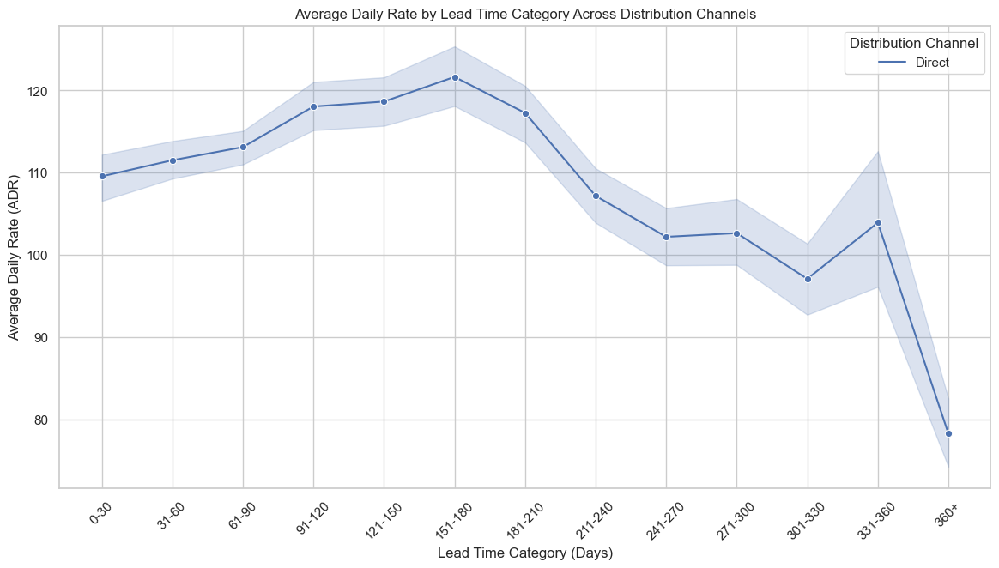

In [25]:
# Analyzing the correlation between lead times and ADRs across different distribution channels

# Group data by distribution channel and lead time, calculating average ADR for each
lead_time_adr_channel = data_last_year.groupby(['Distribution Channel', 'Lead Time']).agg(
    AverageADR=('Avg Daily Rate', 'mean')
).reset_index()

# Since there might be many unique lead times, we'll categorize them into bins for a clearer analysis
lead_time_adr_channel['Lead Time Category'] = pd.cut(lead_time_adr_channel['Lead Time'], bins=[0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, float('inf')], labels=['0-30', '31-60', '61-90', '91-120', '121-150', '151-180', '181-210', '211-240', '241-270', '271-300', '301-330', '331-360', '360+'])

# For simplicity and clarity, we'll visualize the average ADR by lead time category for each distribution channel
plt.figure(figsize=(14, 7))
sns.lineplot(data=lead_time_adr_channel, x='Lead Time Category', y='AverageADR', hue='Distribution Channel', marker='o')
plt.title('Average Daily Rate by Lead Time Category Across Distribution Channels')
plt.xlabel('Lead Time Category (Days)')
plt.ylabel('Average Daily Rate (ADR)')
plt.xticks(rotation=45)
plt.legend(title='Distribution Channel', loc='upper right')
plt.grid(True)
plt.show()

# This step will highlight if certain distribution channels tend to have higher or lower ADRs based on how far in advance the booking is made.


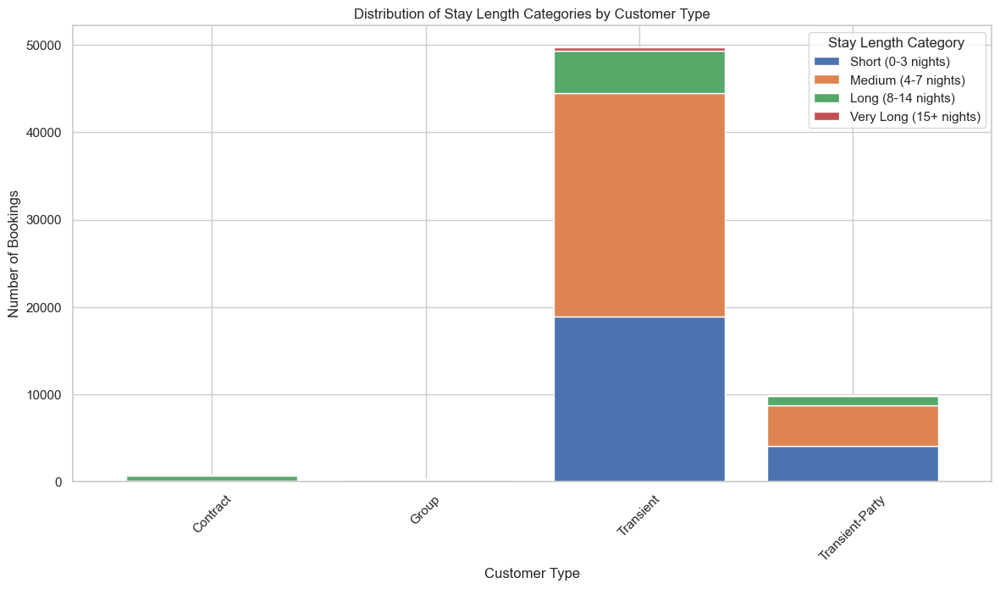

In [26]:
# Categorizing the length of stay into bins (Short, Medium, Long) for analysis
# Define bins for length of stay
bins = [0, 3, 7, 14, float('inf')]
labels = ['Short (0-3 nights)', 'Medium (4-7 nights)', 'Long (8-14 nights)', 'Very Long (15+ nights)']

# Categorize length of stay for each booking in the last year
data_last_year['Stay Category'] = pd.cut(data_last_year['Nights'], bins=bins, labels=labels, right=False)

# Analyze the distribution of stay categories across different customer types
stay_category_customer_type = data_last_year.groupby(['Customer Type', 'Stay Category']).size().unstack(fill_value=0)

# Plotting
stay_category_customer_type.plot(kind='bar', figsize=(14, 7), width=0.8, stacked=True)
plt.title('Distribution of Stay Length Categories by Customer Type')
plt.xlabel('Customer Type')
plt.ylabel('Number of Bookings')
plt.xticks(rotation=45)
plt.legend(title='Stay Length Category')
plt.show()

# This analysis aims to identify patterns in the length of stay preferences among different customer types, potentially informing targeted marketing or service offerings.


In [27]:
#What is the impact of deposit types on cancellation rates and average daily rates (ADR), specifically analyzing how these variables correlate across different customer types over the past year

# Step 1: Prepare the data focusing on deposit types, customer types, cancellation rates, and ADRs
data_deposit_analysis = data_last_year[['Deposit Type', 'Customer Type', 'Cancelled (0/1)', 'Avg Daily Rate']]

# To analyze the impact, we need to calculate the cancellation rate and average ADR by deposit type and customer type
# Group by Deposit Type and Customer Type
grouped_data_deposit = data_deposit_analysis.groupby(['Deposit Type', 'Customer Type']).agg(
    CancellationRate=('Cancelled (0/1)', 'mean'),
    AverageADR=('Avg Daily Rate', 'mean')
).reset_index()

grouped_data_deposit.head(), grouped_data_deposit.shape


(     Deposit Type    Customer Type  CancellationRate  AverageADR
 0      No Deposit         Contract          0.110974   84.276880
 1      No Deposit            Group          0.074830   89.694388
 2      No Deposit        Transient          0.340997  114.796731
 3      No Deposit  Transient-Party          0.196629   91.263660
 4  Non Refundable        Transient          1.000000   95.526577,
 (9, 4))

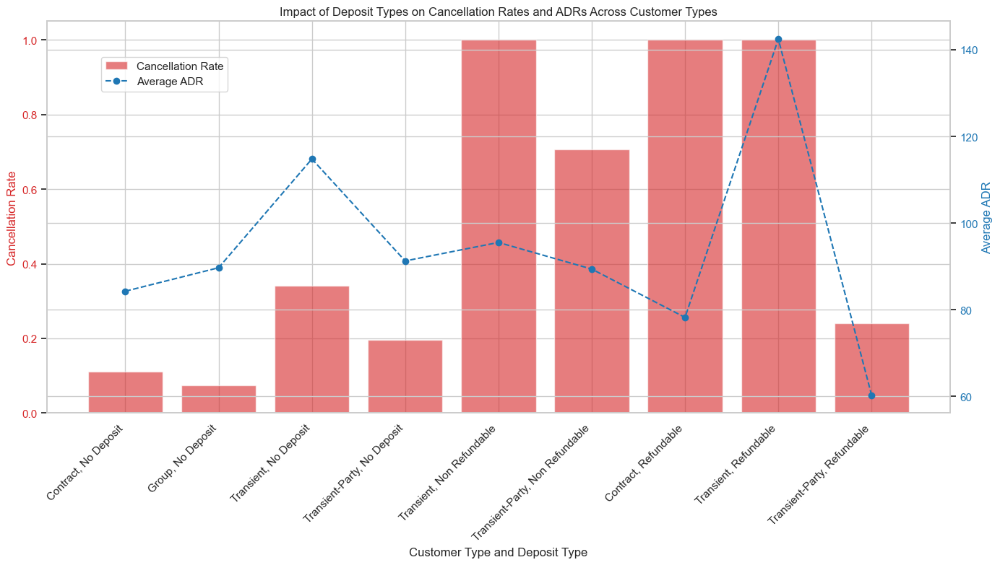

In [28]:
# Step 2: Visualize the impact of deposit types on cancellation rates and ADRs across customer types

# Setting up the figure
fig, ax1 = plt.subplots(figsize=(14, 8))

# Plotting the cancellation rate
color = 'tab:red'
ax1.set_xlabel('Customer Type and Deposit Type')
ax1.set_ylabel('Cancellation Rate', color=color)
ax1.bar(grouped_data_deposit.index, grouped_data_deposit['CancellationRate'], color=color, alpha=0.6, label='Cancellation Rate')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticks(grouped_data_deposit.index)
ax1.set_xticklabels(grouped_data_deposit[['Customer Type', 'Deposit Type']].apply(lambda x: f'{x[0]}, {x[1]}', axis=1), rotation=45, ha="right")

# Instantiating a second axes that shares the same x-axis
ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('Average ADR', color=color)  # We already handled the x-label with ax1
ax2.plot(grouped_data_deposit.index, grouped_data_deposit['AverageADR'], color=color, marker='o', linestyle='--', label='Average ADR')
ax2.tick_params(axis='y', labelcolor=color)

# Adding a legend and a title
fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9))
plt.title('Impact of Deposit Types on Cancellation Rates and ADRs Across Customer Types')

fig.tight_layout()  # To ensure the right y-label is not slightly clipped
plt.show()

# This visualization aims to highlight how different deposit requirements influence booking cancellation rates and pricing strategies across various customer segments.


**Cancellation Rate Variability:** The cancellation rate significantly varies between different combinations of deposit types and customer types. Notably, bookings labeled as "Non Refundable" for transient customers have a 100% cancellation rate, suggesting that these might be pre-labeled as non-refundable due to being canceled.

**
ADR Correlation**: The average ADR also shows variation across these segments, indicating that deposit type and customer behavior (as reflected in cancellation rates) could influence or correlate with the pricing strategy employed by the hotel.

**
Strategic Implication**s: Understanding these dynamics is crucial for the hotel chain. It suggests that adjusting deposit policies and pricing strategies by customer type could potentially reduce cancellations and optimize revenue.

# Data cleaning for feeding to ML models

In [40]:
df2 = pd.get_dummies(df,
                     columns=['Distribution Channel', 'Customer Type',
                              'Deposit Type', 'Status', 'Hotel'],
                     drop_first=True)

df2.head()

,Booking ID,Booking Date,Arrival Date,Lead Time,Nights,Guests,Country,Avg Daily Rate,Status Update,Cancelled (0/1),...,Distribution Channel_Online Travel Agent,Customer Type_Group,Customer Type_Transient,Customer Type_Transient-Party,Deposit Type_Non Refundable,Deposit Type_Refundable,Status_Check-Out,Status_No-Show,Status_sggrthrwtrhrtb,Hotel_Resort
0,1,2014-07-24,2015-07-01,342,0,2,Portugal,0.0,2015-07-01,0,...,False,False,True,False,False,False,True,False,False,True
1,2,2013-06-24,2015-07-01,737,0,2,Portugal,0.0,2015-07-01,0,...,False,False,True,False,False,False,True,False,False,True
2,3,2015-06-24,2015-07-01,7,1,1,United Kingdom,75.0,2015-07-02,0,...,False,False,True,False,False,False,True,False,False,True
3,4,2015-06-18,2015-07-01,13,1,1,United Kingdom,75.0,2015-07-02,0,...,False,False,True,False,False,False,True,False,False,True
4,5,2015-06-17,2015-07-01,14,2,2,United Kingdom,98.0,2015-07-03,0,...,True,False,True,False,False,False,True,False,False,True


In [41]:
df3 = df2.drop(['Booking ID', 'Booking Date', 'Status Update',
                'Arrival Date', 'Status_sggrthrwtrhrtb', 'Year-Month'],
               axis=1)

df3.head()

,Lead Time,Nights,Guests,Country,Avg Daily Rate,Cancelled (0/1),Revenue,Revenue Loss,Booking Year,Booking Month,...,Distribution Channel_Direct,Distribution Channel_Online Travel Agent,Customer Type_Group,Customer Type_Transient,Customer Type_Transient-Party,Deposit Type_Non Refundable,Deposit Type_Refundable,Status_Check-Out,Status_No-Show,Hotel_Resort
0,342,0,2,Portugal,0.0,0,0.0,0.0,2014,7,...,True,False,False,True,False,False,False,True,False,True
1,737,0,2,Portugal,0.0,0,0.0,0.0,2013,6,...,True,False,False,True,False,False,False,True,False,True
2,7,1,1,United Kingdom,75.0,0,75.0,0.0,2015,6,...,True,False,False,True,False,False,False,True,False,True
3,13,1,1,United Kingdom,75.0,0,75.0,0.0,2015,6,...,False,False,False,True,False,False,False,True,False,True
4,14,2,2,United Kingdom,98.0,0,196.0,0.0,2015,6,...,False,True,False,True,False,False,False,True,False,True


In [42]:
df3 = df3.dropna()

In [43]:
df3.isna().sum()
df3.head()

,Lead Time,Nights,Guests,Country,Avg Daily Rate,Cancelled (0/1),Revenue,Revenue Loss,Booking Year,Booking Month,...,Distribution Channel_Direct,Distribution Channel_Online Travel Agent,Customer Type_Group,Customer Type_Transient,Customer Type_Transient-Party,Deposit Type_Non Refundable,Deposit Type_Refundable,Status_Check-Out,Status_No-Show,Hotel_Resort
0,342,0,2,Portugal,0.0,0,0.0,0.0,2014,7,...,True,False,False,True,False,False,False,True,False,True
1,737,0,2,Portugal,0.0,0,0.0,0.0,2013,6,...,True,False,False,True,False,False,False,True,False,True
2,7,1,1,United Kingdom,75.0,0,75.0,0.0,2015,6,...,True,False,False,True,False,False,False,True,False,True
3,13,1,1,United Kingdom,75.0,0,75.0,0.0,2015,6,...,False,False,False,True,False,False,False,True,False,True
4,14,2,2,United Kingdom,98.0,0,196.0,0.0,2015,6,...,False,True,False,True,False,False,False,True,False,True


In [44]:
len(df3['Country'].unique())

175

In [45]:
from sklearn import preprocessing

label_encoder = preprocessing.LabelEncoder()
df3['Country']= label_encoder.fit_transform(df3['Country'])

df3['Country'].unique()

array([128, 165, 166, 148,  77,  55, 167, 132, 119, 120,   7, 127,  60,
        18, 153,  33,  63,  80, 114,  42, 133, 152,  10,  50,  41,  23,
        54, 110,  22,  94, 146,   0,  73, 106, 109, 163, 137,  89, 129,
       141,  32,  11,  17,  93, 161, 147,   4,  79,  30, 173,  29, 174,
         1, 131,  36,  71, 164, 160,  81,  38,  70,  75,  59,   3,  62,
       168,  83,  31,  40,  34,  66,  88, 118, 100, 170, 145,  53,  85,
       121,  74,  90, 126, 140, 142,  12,  14, 116, 158,  45,  96,  99,
         8,  82, 149,  39,  28,  21, 104,  35, 151, 162,  24,  37,  84,
       154, 144,  26, 139, 171, 122, 130,  48, 125, 102,  98,  47,  97,
        72, 169, 113,  13,  95, 159, 155,  43, 138, 135,  51,  76,  69,
       134,  27, 107,  15,  78, 156, 117,  19, 172, 157,  58,  61,  46,
        64,  86,  92,  67, 108, 105,  52, 111, 123,  25,  91, 101, 112,
        20, 124,  16,   9,   5,  49,  44,  56,  68, 136,   6,  65,   2,
       103, 115,  87, 150,  57, 143])

In [46]:
df3.head()

,Lead Time,Nights,Guests,Country,Avg Daily Rate,Cancelled (0/1),Revenue,Revenue Loss,Booking Year,Booking Month,...,Distribution Channel_Direct,Distribution Channel_Online Travel Agent,Customer Type_Group,Customer Type_Transient,Customer Type_Transient-Party,Deposit Type_Non Refundable,Deposit Type_Refundable,Status_Check-Out,Status_No-Show,Hotel_Resort
0,342,0,2,128,0.0,0,0.0,0.0,2014,7,...,True,False,False,True,False,False,False,True,False,True
1,737,0,2,128,0.0,0,0.0,0.0,2013,6,...,True,False,False,True,False,False,False,True,False,True
2,7,1,1,165,75.0,0,75.0,0.0,2015,6,...,True,False,False,True,False,False,False,True,False,True
3,13,1,1,165,75.0,0,75.0,0.0,2015,6,...,False,False,False,True,False,False,False,True,False,True
4,14,2,2,165,98.0,0,196.0,0.0,2015,6,...,False,True,False,True,False,False,False,True,False,True


# Training models

In [47]:
df3.columns

Index(['Lead Time', 'Nights', 'Guests', 'Country', 'Avg Daily Rate',
       'Cancelled (0/1)', 'Revenue', 'Revenue Loss', 'Booking Year',
       'Booking Month', 'Arrival Year', 'Arrival Month', 'Net Revenue', 'Year',
       'Month', 'Distribution Channel_Direct',
       'Distribution Channel_Online Travel Agent', 'Customer Type_Group',
       'Customer Type_Transient', 'Customer Type_Transient-Party',
       'Deposit Type_Non Refundable', 'Deposit Type_Refundable',
       'Status_Check-Out', 'Status_No-Show', 'Hotel_Resort'],
      dtype='object')

In [48]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X = df3.drop('Cancelled (0/1)', axis=1)
y = df3['Cancelled (0/1)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the models
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

logistic_regression = LogisticRegression()
logistic_regression.fit(X_train, y_train)

lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)

random_forest = RandomForestClassifier()
random_forest.fit(X_train, y_train)

gbm = GradientBoostingClassifier()
gbm.fit(X_train, y_train)

# Predict the labels for the test set
y_pred_knn = knn.predict(X_test)
y_pred_logreg = logistic_regression.predict(X_test)
y_pred_lda = lda.predict(X_test)
y_pred_rf = random_forest.predict(X_test)
y_pred_gbm = gbm.predict(X_test)

In [49]:
from sklearn.metrics import accuracy_score

knn_accuracy = accuracy_score(y_test, y_pred_knn)
logreg_accuracy = accuracy_score(y_test, y_pred_logreg)
lda_accuracy = accuracy_score(y_test, y_pred_lda)
rf_accuracy = accuracy_score(y_test, y_pred_rf)
gbm_accuracy = accuracy_score(y_test, y_pred_gbm)

print('KNN accuracy score: ', knn_accuracy)
print('Logistic Regression accuracy score: ', logreg_accuracy)
print('LDA accuracy score: ', lda_accuracy)
print('Random Forest accuracy score: ', rf_accuracy)
print('Gradient Boosting accuracy score: ', gbm_accuracy)

KNN accuracy score:  0.9881062065499623
Logistic Regression accuracy score:  0.9902001842700394
LDA accuracy score:  0.9209732808442919
Random Forest accuracy score:  1.0
Gradient Boosting accuracy score:  1.0


In [50]:
train_accuracy_knn = knn.score(X_train, y_train)
train_accuracy_logreg = logistic_regression.score(X_train, y_train)
train_accuracy_lda = lda.score(X_train, y_train)
train_accuracy_rf = random_forest.score(X_train, y_train)
train_accuracy_gbm = gbm.score(X_train, y_train)

print("Training accuracy for KNN:", train_accuracy_knn)
print("Training accuracy for Logistic Regression:", train_accuracy_logreg)
print("Training accuracy for Linear Discriminant Analysis (LDA):", train_accuracy_lda)
print("Training accuracy for Random Forest:", train_accuracy_rf)
print("Training accuracy for Gradient Boosting Machines (GBM):", train_accuracy_gbm)

Training accuracy for KNN: 0.9911320043554737
Training accuracy for Logistic Regression: 0.9898442080576263
Training accuracy for Linear Discriminant Analysis (LDA): 0.9232766563363766
Training accuracy for Random Forest: 1.0
Training accuracy for Gradient Boosting Machines (GBM): 1.0


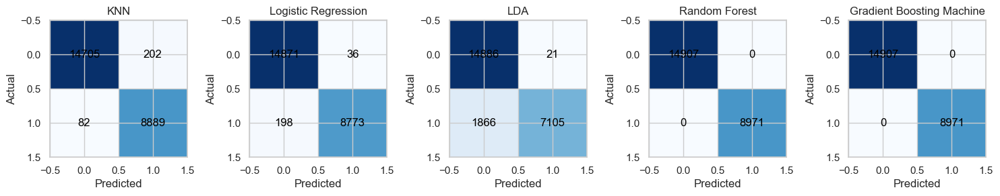

In [53]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(1, 5, figsize=(15, 10))

# Plot the confusion matrix for each model
confusion_matrix_knn = confusion_matrix(y_test, y_pred_knn)
axes[0].imshow(confusion_matrix_knn, cmap='Blues')
axes[0].set_title('KNN')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('Actual')
for i in range(len(confusion_matrix_knn)):
  for j in range(len(confusion_matrix_knn[0])):
    axes[0].text(j, i, confusion_matrix_knn[i][j], ha='center', va='center', color='black')

confusion_matrix_logreg = confusion_matrix(y_test, y_pred_logreg)
axes[1].imshow(confusion_matrix_logreg, cmap='Blues')
axes[1].set_title('Logistic Regression')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('Actual')
for i in range(len(confusion_matrix_logreg)):
  for j in range(len(confusion_matrix_logreg[0])):
    axes[1].text(j, i, confusion_matrix_logreg[i][j], ha='center', va='center', color='black')

confusion_matrix_lda = confusion_matrix(y_test, y_pred_lda)
axes[2].imshow(confusion_matrix_lda, cmap='Blues')
axes[2].set_title('LDA')
axes[2].set_xlabel('Predicted')
axes[2].set_ylabel('Actual')
for i in range(len(confusion_matrix_lda)):
  for j in range(len(confusion_matrix_lda[0])):
    axes[2].text(j, i, confusion_matrix_lda[i][j], ha='center', va='center', color='black')

confusion_matrix_rf = confusion_matrix(y_test, y_pred_rf)
axes[3].imshow(confusion_matrix_rf, cmap='Blues')
axes[3].set_title('Random Forest')
axes[3].set_xlabel('Predicted')
axes[3].set_ylabel('Actual')
for i in range(len(confusion_matrix_rf)):
  for j in range(len(confusion_matrix_rf[0])):
    axes[3].text(j, i, confusion_matrix_rf[i][j], ha='center', va='center', color='black')
    
confusion_matrix_gbm = confusion_matrix(y_test, y_pred_gbm)
axes[4].imshow(confusion_matrix_gbm, cmap='Blues')
axes[4].set_title('Gradient Boosting Machine')
axes[4].set_xlabel('Predicted')
axes[4].set_ylabel('Actual')
for i in range(len(confusion_matrix_rf)):
  for j in range(len(confusion_matrix_rf[0])):
    axes[4].text(j, i, confusion_matrix_rf[i][j], ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

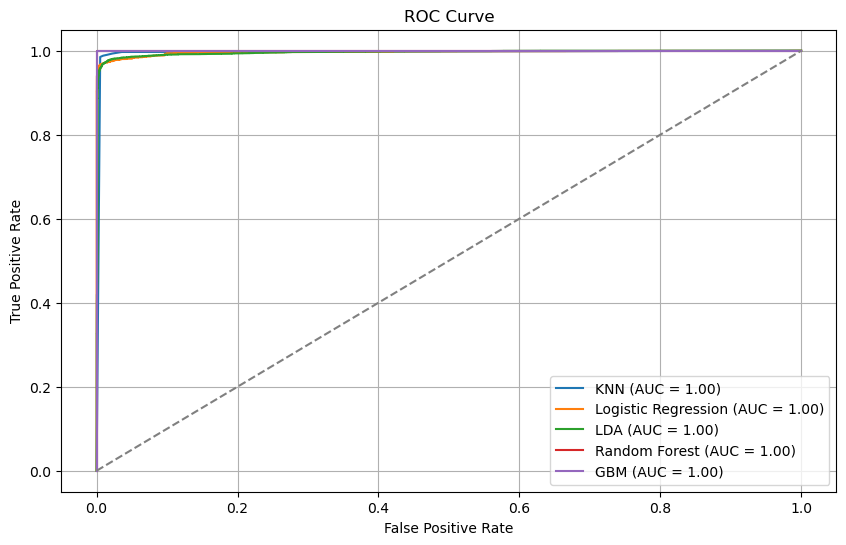

In [40]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Calculate ROC curve and AUC score for KNN
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, knn.predict_proba(X_test)[:, 1])
auc_knn = roc_auc_score(y_test, knn.predict_proba(X_test)[:, 1])

# Calculate ROC curve and AUC score for Logistic Regression
fpr_logreg, tpr_logreg, thresholds_logreg = roc_curve(y_test, logistic_regression.predict_proba(X_test)[:, 1])
auc_logreg = roc_auc_score(y_test, logistic_regression.predict_proba(X_test)[:, 1])

# Calculate ROC curve and AUC score for LDA
fpr_lda, tpr_lda, thresholds_lda = roc_curve(y_test, lda.predict_proba(X_test)[:, 1])
auc_lda = roc_auc_score(y_test, lda.predict_proba(X_test)[:, 1])

# Calculate ROC curve and AUC score for Random Forest
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, random_forest.predict_proba(X_test)[:, 1])
auc_rf = roc_auc_score(y_test, random_forest.predict_proba(X_test)[:, 1])

# Calculate ROC curve and AUC score for GBM
fpr_gbm, tpr_gbm, thresholds_gbm = roc_curve(y_test, gbm.predict_proba(X_test)[:, 1])
auc_gbm = roc_auc_score(y_test, gbm.predict_proba(X_test)[:, 1])

# Plot ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_knn, tpr_knn, label=f'KNN (AUC = {auc_knn:.2f})')
plt.plot(fpr_logreg, tpr_logreg, label=f'Logistic Regression (AUC = {auc_logreg:.2f})')
plt.plot(fpr_lda, tpr_lda, label=f'LDA (AUC = {auc_lda:.2f})')
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {auc_rf:.2f})')
plt.plot(fpr_gbm, tpr_gbm, label=f'GBM (AUC = {auc_gbm:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='grey')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()


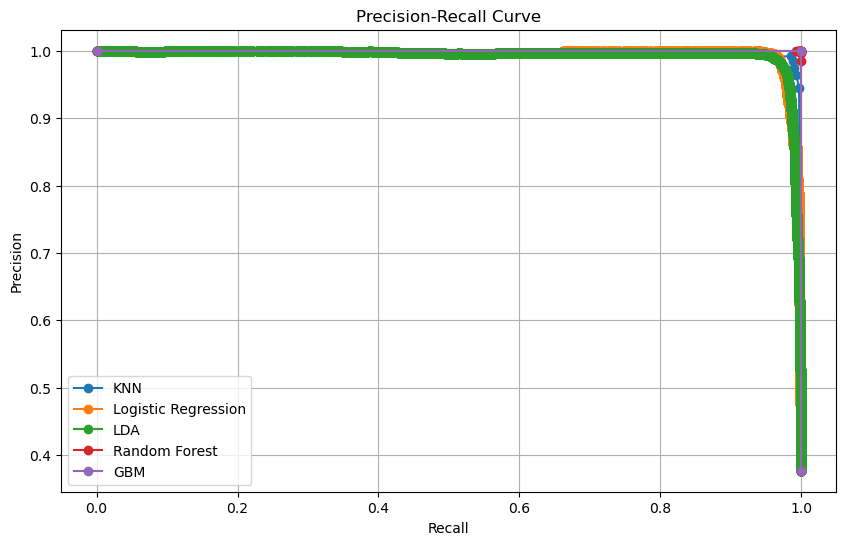

In [41]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Calculate precision-recall curve for KNN
precision_knn, recall_knn, _ = precision_recall_curve(y_test, knn.predict_proba(X_test)[:, 1])

# Calculate precision-recall curve for Logistic Regression
precision_logreg, recall_logreg, _ = precision_recall_curve(y_test, logistic_regression.predict_proba(X_test)[:, 1])

# Calculate precision-recall curve for LDA
precision_lda, recall_lda, _ = precision_recall_curve(y_test, lda.predict_proba(X_test)[:, 1])

# Calculate precision-recall curve for Random Forest
precision_rf, recall_rf, _ = precision_recall_curve(y_test, random_forest.predict_proba(X_test)[:, 1])

# Calculate precision-recall curve for GBM
precision_gbm, recall_gbm, _ = precision_recall_curve(y_test, gbm.predict_proba(X_test)[:, 1])

# Plot precision-recall curves
plt.figure(figsize=(10, 6))
plt.plot(recall_knn, precision_knn, marker='o', label='KNN')
plt.plot(recall_logreg, precision_logreg, marker='o', label='Logistic Regression')
plt.plot(recall_lda, precision_lda, marker='o', label='LDA')
plt.plot(recall_rf, precision_rf, marker='o', label='Random Forest')
plt.plot(recall_gbm, precision_gbm, marker='o', label='GBM')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()


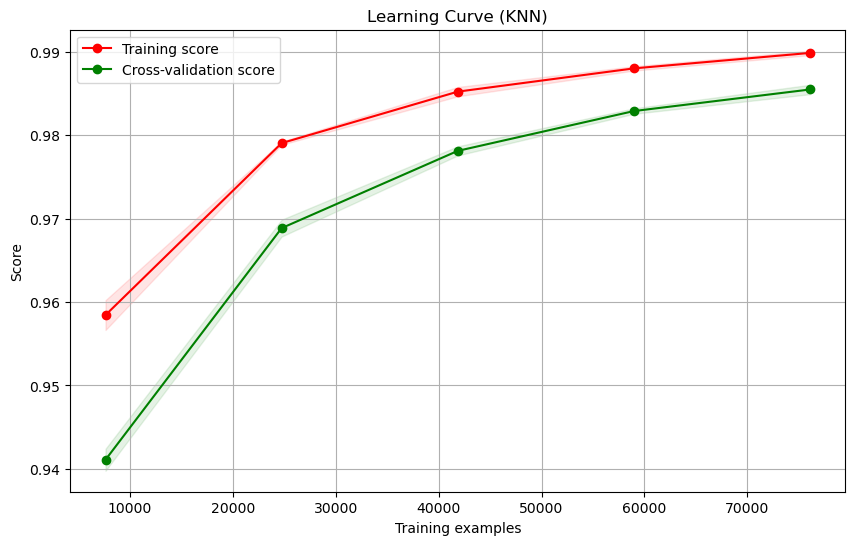

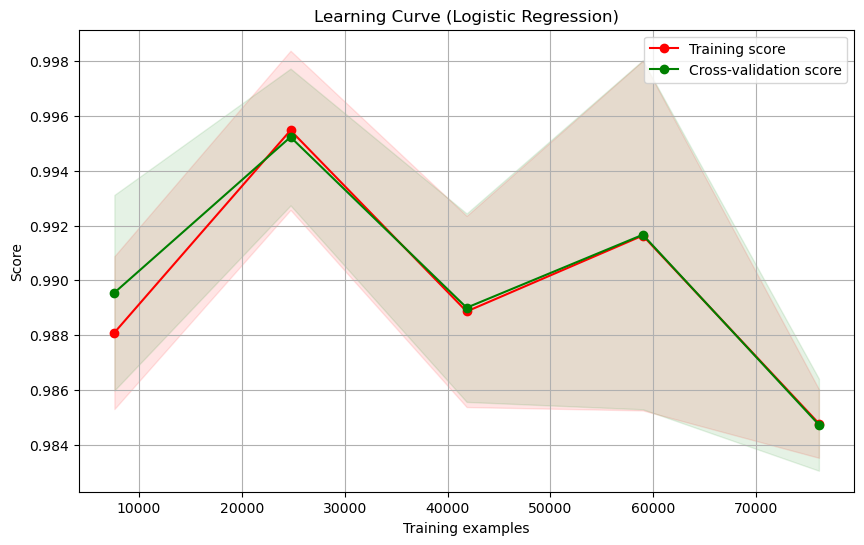

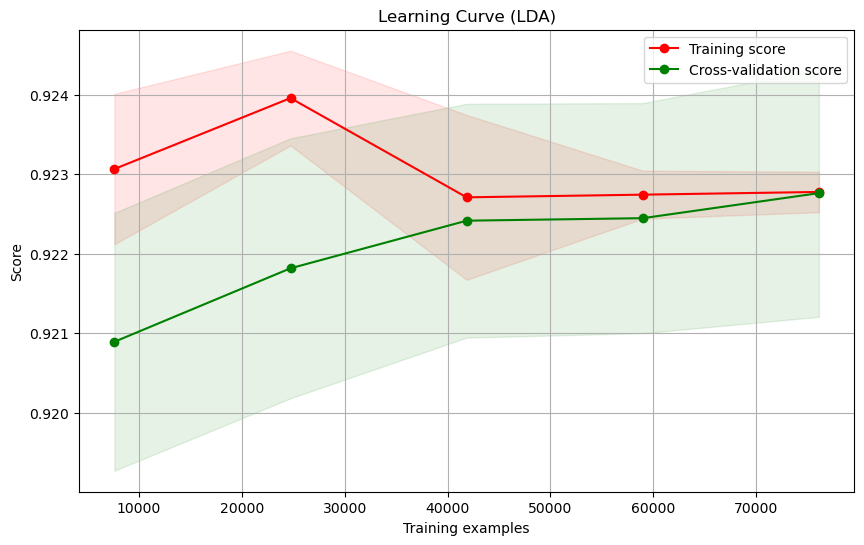

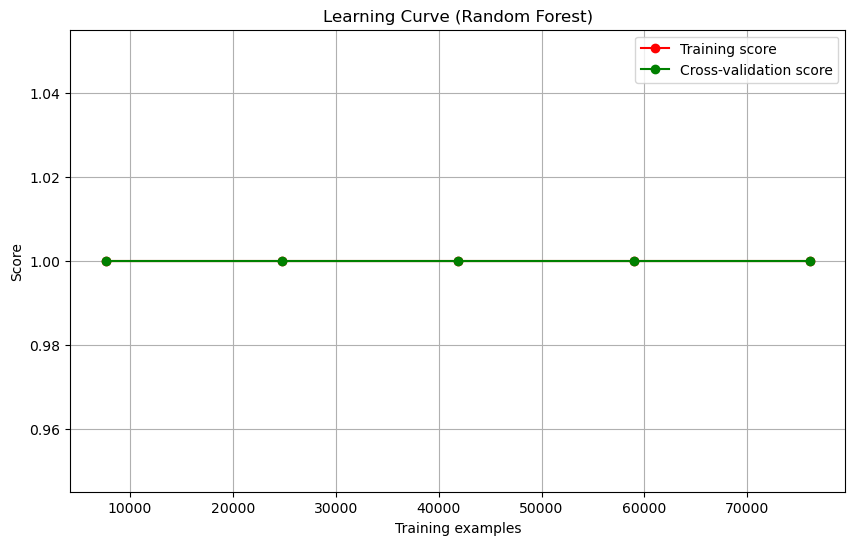

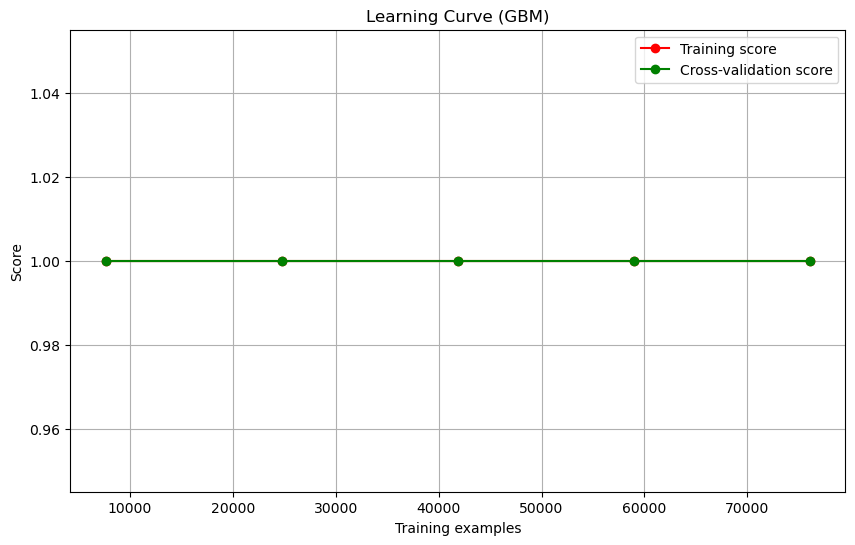

In [42]:
from sklearn.model_selection import learning_curve
import numpy as np
import matplotlib.pyplot as plt

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    
    plt.figure(figsize=(10, 6))
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Plot learning curves
plot_learning_curve(knn, "Learning Curve (KNN)", X_train, y_train, cv=5)
plt.show()

plot_learning_curve(logistic_regression, "Learning Curve (Logistic Regression)", X_train, y_train, cv=5)
plt.show()

plot_learning_curve(lda, "Learning Curve (LDA)", X_train, y_train, cv=5)
plt.show()

plot_learning_curve(random_forest, "Learning Curve (Random Forest)", X_train, y_train, cv=5)
plt.show()

plot_learning_curve(gbm, "Learning Curve (GBM)", X_train, y_train, cv=5)
plt.show()


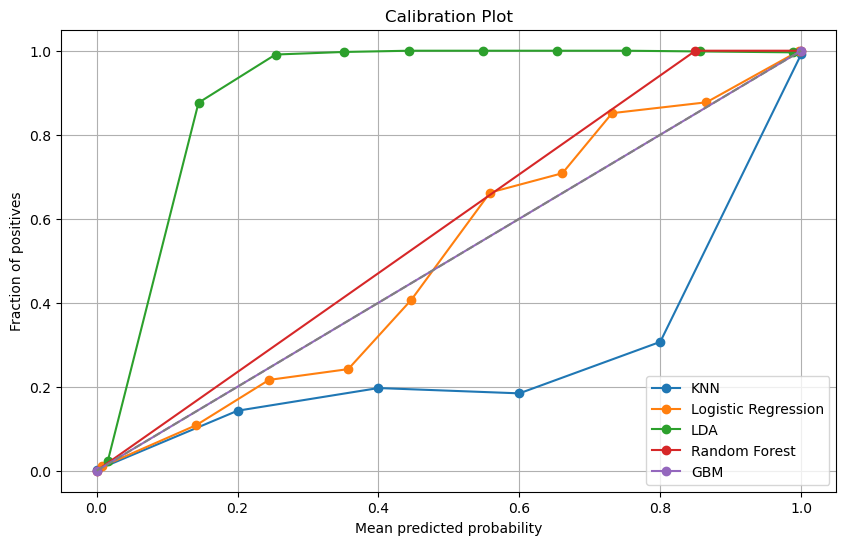

In [43]:
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt

# Calculate calibration curve for KNN
prob_pos_knn, mean_pred_knn = calibration_curve(y_test, knn.predict_proba(X_test)[:, 1], n_bins=10)

# Calculate calibration curve for Logistic Regression
prob_pos_logreg, mean_pred_logreg = calibration_curve(y_test, logistic_regression.predict_proba(X_test)[:, 1], n_bins=10)

# Calculate calibration curve for LDA
prob_pos_lda, mean_pred_lda = calibration_curve(y_test, lda.predict_proba(X_test)[:, 1], n_bins=10)

# Calculate calibration curve for Random Forest
prob_pos_rf, mean_pred_rf = calibration_curve(y_test, random_forest.predict_proba(X_test)[:, 1], n_bins=10)

# Calculate calibration curve for GBM
prob_pos_gbm, mean_pred_gbm = calibration_curve(y_test, gbm.predict_proba(X_test)[:, 1], n_bins=10)

# Plot calibration curves
plt.figure(figsize=(10, 6))
plt.plot(mean_pred_knn, prob_pos_knn, marker='o', label='KNN')
plt.plot(mean_pred_logreg, prob_pos_logreg, marker='o', label='Logistic Regression')
plt.plot(mean_pred_lda, prob_pos_lda, marker='o', label='LDA')
plt.plot(mean_pred_rf, prob_pos_rf, marker='o', label='Random Forest')
plt.plot(mean_pred_gbm, prob_pos_gbm, marker='o', label='GBM')
plt.plot([0, 1], [0, 1], linestyle='--', color='grey')
plt.xlabel('Mean predicted probability')
plt.ylabel('Fraction of positives')
plt.title('Calibration Plot')
plt.legend()
plt.grid(True)
plt.show()
